<a href="https://colab.research.google.com/github/Zshoham/YHB/blob/main/assignment4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Loading

In [ ]:
import requests
import tarfile
import os
import numpy as np
import glob
from shutil import copyfile

IMAGE_PATH = "/content/VOCdevkit/VOC2007/JPEGImages/"


if not os.path.isdir("VOCdevkit"):
  data = requests.get("http://host.robots.ox.ac.uk/pascal/VOC/voc2007/VOCtrainval_06-Nov-2007.tar")
  with open("data.tar", 'wb') as f:
      f.write(data.content) 

  tar = tarfile.open("data.tar")
  tar.extractall()
  tar.close()

img_paths = glob.glob(IMAGE_PATH + '*.jpg')
np.random.shuffle(img_paths)

num_imgs = len(img_paths)
num_train = int((num_imgs/5) * 4)
num_val = int(((num_imgs - num_train) / 10) * 9)


if not os.path.isdir("train"):
  os.mkdir("train")
  train_imgs = img_paths[:num_train] 
  for i, img in enumerate(train_imgs):
    copyfile(img, os.path.join("train", f"train_{i}.jpg"))

if not os.path.isdir("val"):
  os.mkdir("val")
  val_imgs = img_paths[num_train:num_train + num_val]
  for i, img in enumerate(val_imgs):
    copyfile(img, os.path.join("val", f"val_{i}.jpg"))

if not os.path.isdir("test"):
  os.mkdir("test")
  test_imgs = img_paths[num_train + num_val:]
  for i, img in enumerate(test_imgs):
    copyfile(img, os.path.join("test", f"test_{i}.jpg"))


In [ ]:
from tensorflow import keras
from PIL import Image
from cv2 import imread
from cv2 import resize
import math


class SuperResolutionGenerator(keras.utils.Sequence):
  """
  We use a custom data generator that will be able to load images and 
  create batches with two target images or one target image depending on 
  the 'use_large' parameter.
  """

  def __init__(self, path, batch_size, use_large=True, cut=None, *args, **kwargs):
    self.img_paths = glob.glob(path + '/*.jpg')
    if cut:
      self.img_paths = self.img_paths[:cut]
    self.batch_size = batch_size
    self.use_large = use_large
  
  def __len__(self):
    return math.ceil(len(self.img_paths) / self.batch_size)

  def __getitem__(self, index):
    imgs = self.img_paths[self.batch_size * index: self.batch_size * (index + 1)]

    x = []
    y_mid = []
    y_large = []

    for path in imgs:
      img = imread(path)[:, :, ::-1] # convert image to rgb
      img = img /255 # normalize img data
      x.append(resize(img, (72, 72)))
      y_mid.append(resize(img, (144, 144)))
      if self.use_large:
        y_large.append(resize(img, (288, 288)))

    x = np.array(x)
    y_mid = np.array(y_mid)
    y_large = np.array(y_large)

    if self.use_large:
      y = [y_mid, y_large]
    else:
      y = y_mid

    return x, y

# Data Exploration

In [ ]:
import matplotlib.pyplot as plt

def batch_wise_indexs(batch_size, index):
  return int(index / batch_size), index % batch_size

def plot_imgs(data, index):
  fig, aux = plt.subplots(1,3, figsize=(20,6))
  batch, batch_index = batch_wise_indexs(data.batch_size, index)
  small, (mid, large) = data[batch]
  aux[0].imshow(small[batch_index])
  aux[1].imshow(mid[batch_index])
  aux[2].imshow(large[batch_index])

In [ ]:
train_data = SuperResolutionGenerator("train", 1)
val_data = SuperResolutionGenerator("val", 1)
test_data = SuperResolutionGenerator("test", 1)

Here we can see the an example image from the training, validation, and testing data with all three resolutions compared.
We can immediately see that the difference between the low res image and the mid res image is very noticable, and we can see that much data is lost when looking at the low res image. the difference between the mid res and high res images are less obvious, though they are visable.  

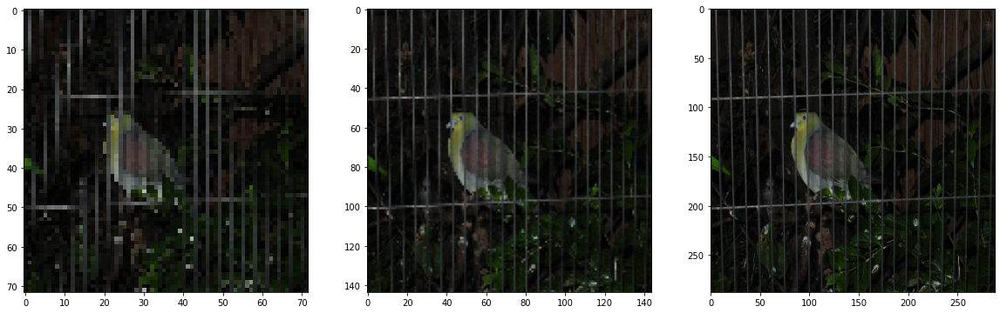

In [ ]:
plot_imgs(train_data, 0)

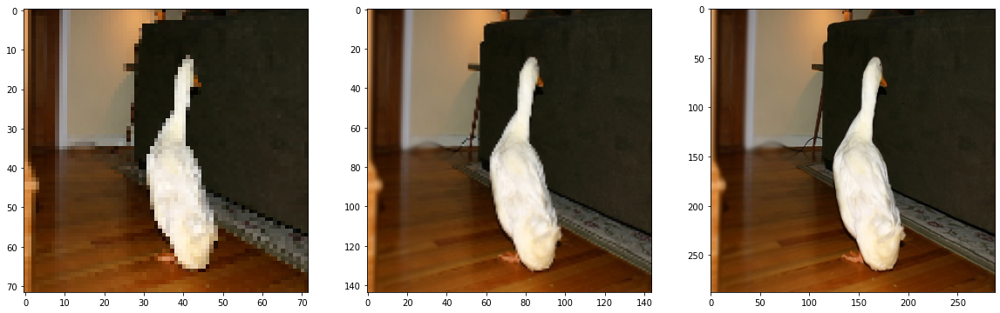

In [ ]:
plot_imgs(val_data, 0)

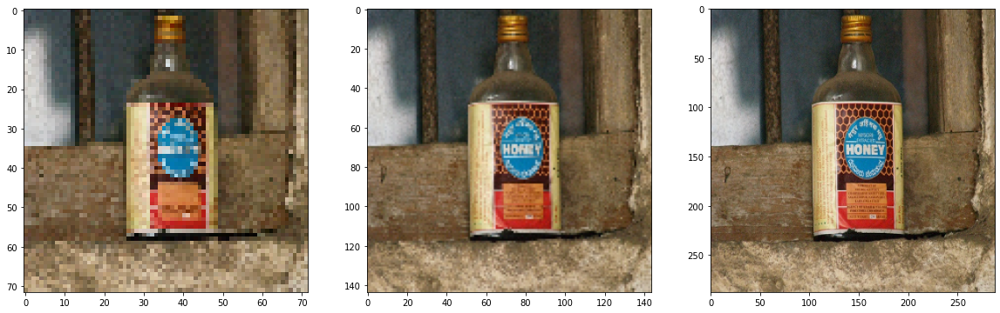

In [ ]:
plot_imgs(test_data, 0)

# Evaluation

In [ ]:
import matplotlib.pyplot as plt

def batch_wise_indexs(batch_size, index):
  return int(index / batch_size), index % batch_size

def compare_pred(data, pred, index):
  fig, aux = plt.subplots(2,3, figsize=(20,10))
  batch, batch_index = batch_wise_indexs(data.batch_size, index)
  small, (mid, large) = data[batch]
  p_mid, p_large = pred

  aux[0][0].imshow(small[batch_index])
  aux[1][0].imshow(small[batch_index])

  aux[0][1].imshow(mid[batch_index])
  aux[1][1].imshow(p_mid[index])

  aux[0][2].imshow(large[batch_index])
  aux[1][2].imshow(p_large[index])

# Single Resolution

## Training

In [ ]:
train_data = SuperResolutionGenerator("train", 5, use_large=False, cut=100)
val_data = SuperResolutionGenerator("val", 5, use_large=False, cut=30)
test_data = SuperResolutionGenerator("test", 5, use_large=False, cut = 10)

In [ ]:
def compare_single_pred(data, pred, index):
  fig, aux = plt.subplots(2,2, figsize=(15,10))
  batch, batch_index = batch_wise_indexs(data.batch_size, index)
  small, mid = data[batch]
  p_mid = pred

  aux[0][0].imshow(small[batch_index])
  aux[1][0].imshow(small[batch_index])

  aux[0][1].imshow(mid[batch_index])
  aux[1][1].imshow(p_mid[index])


In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras import layers
from keras import Model

def model_gen():
  res = keras.Sequential([
    layers.Input((72, 72, 3)),
    layers.Conv2D(64, 3, activation='relu', padding='same'),
    layers.Conv2D(64, 3, activation='relu', padding='same'),
    layers.UpSampling2D(interpolation='nearest'),
    layers.Conv2D(3, 1, activation='sigmoid')
  ])
  res.compile(optimizer='adam', loss='mse', metrics=['mae'])
  return res

model = model_gen()
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 72, 72, 64)        1792      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 72, 72, 64)        36928     
_________________________________________________________________
up_sampling2d (UpSampling2D) (None, 144, 144, 64)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 144, 144, 3)       195       
Total params: 38,915
Trainable params: 38,915
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.fit(train_data, validation_data=val_data, epochs=10)

Epoch 1/10
20/20 [==============================] - 8s 66ms/step - loss: 0.0799 - mae: 0.2445 - val_loss: 0.0524 - val_mae: 0.1924
Epoch 2/10
20/20 [==============================] - 1s 46ms/step - loss: 0.0434 - mae: 0.1762 - val_loss: 0.0177 - val_mae: 0.1008
Epoch 3/10
20/20 [==============================] - 1s 46ms/step - loss: 0.0145 - mae: 0.0900 - val_loss: 0.0132 - val_mae: 0.0781
Epoch 4/10
20/20 [==============================] - 1s 46ms/step - loss: 0.0102 - mae: 0.0716 - val_loss: 0.0111 - val_mae: 0.0711
Epoch 5/10
20/20 [==============================] - 1s 48ms/step - loss: 0.0098 - mae: 0.0677 - val_loss: 0.0100 - val_mae: 0.0672
Epoch 6/10
20/20 [==============================] - 1s 47ms/step - loss: 0.0083 - mae: 0.0615 - val_loss: 0.0097 - val_mae: 0.0659
Epoch 7/10
20/20 [==============================] - 1s 46ms/step - loss: 0.0088 - mae: 0.0626 - val_loss: 0.0092 - val_mae: 0.0629
Epoch 8/10
20/20 [==============================] - 1s 47ms/step - loss: 0.0086 - m

## Results

Below we can see a comparison between the target images (above) and the predicted images (below). We can see an improvment in resolution, and we can see that the objects in the image are recognaizable in our predicted image.
In the validation and test examples the low res image is already quite detailed, and it is easy to recognize the objects in the image. but in the training example we can see a very clear improvemnt, as the low res water seems very odd and pixelated, and the predicted mid res image provides much greater detail and the water looks much smoother and more realistic.
That said we can see that the model mostly blurs the images by adding similarly colored pixels around the original pixels. 

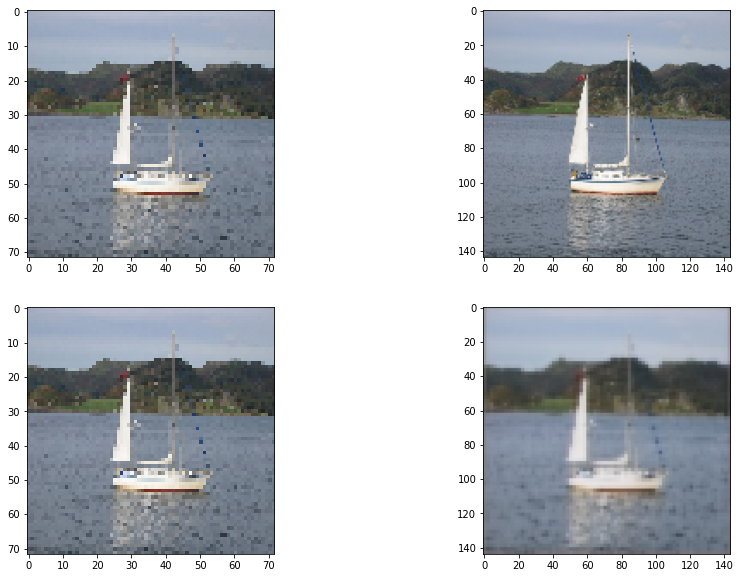

In [ ]:
us_train = model.predict(train_data)
compare_single_pred(train_data, us_train, 0)

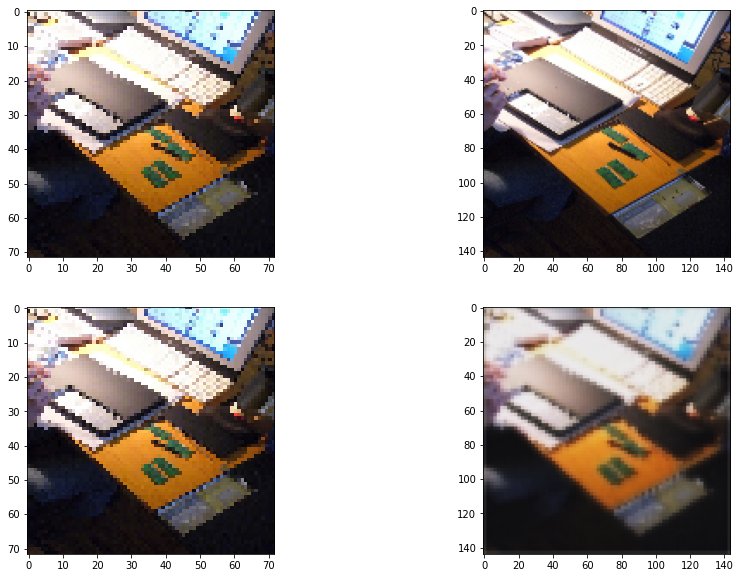

In [ ]:
us_val = model.predict(val_data)
compare_single_pred(val_data, us_val, 0)

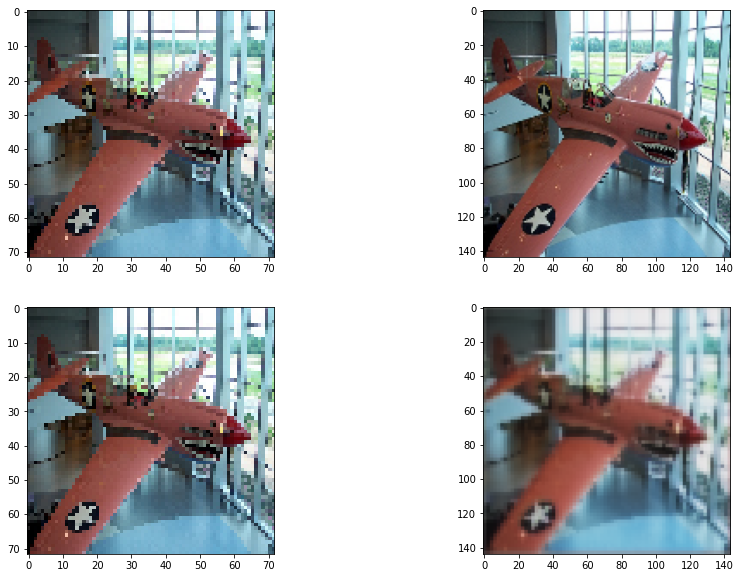

In [ ]:
us_test = model.predict(test_data)
compare_single_pred(test_data, us_test, 0)

# Multi Resolution Output

## Training

In [ ]:
train_data = SuperResolutionGenerator("train", 5, cut=100)
val_data = SuperResolutionGenerator("val", 5, cut=30)
test_data = SuperResolutionGenerator("test", 5, cut=10)

Model: "multi_scale"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 72, 72, 3)]  0                                            
__________________________________________________________________________________________________
base_conv1 (Conv2D)             (None, 72, 72, 64)   1792        input_2[0][0]                    
__________________________________________________________________________________________________
base_conv2 (Conv2D)             (None, 72, 72, 64)   36928       base_conv1[0][0]                 
__________________________________________________________________________________________________
us_mid (UpSampling2D)           (None, 144, 144, 64) 0           base_conv2[0][0]                 
________________________________________________________________________________________

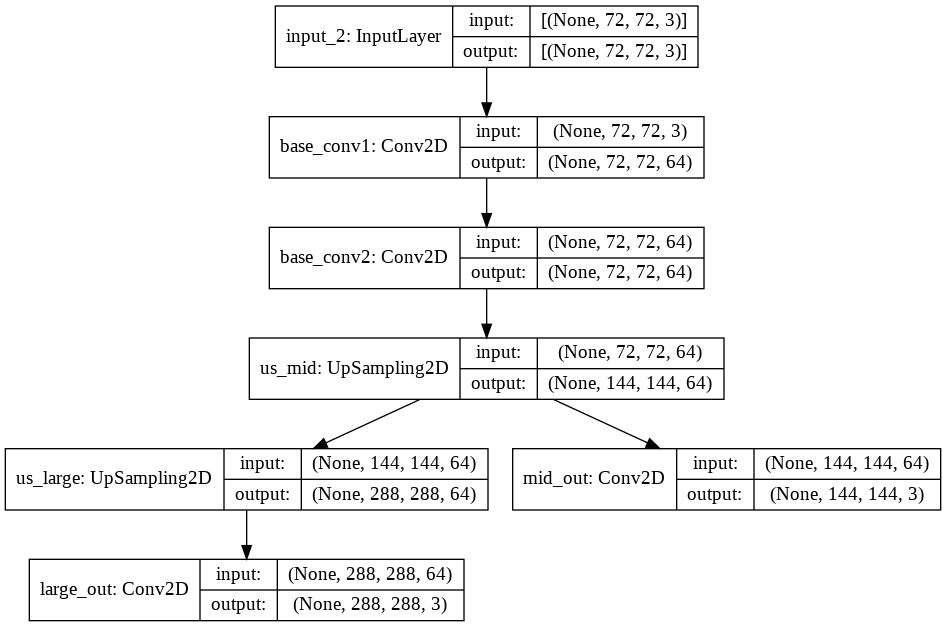

In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras import layers
from keras import Model


def psnr(y_true, y_pred):
  return tf.reduce_mean(tf.image.psnr(y_true, y_pred, max_val=1.0))

def model_gen():
  inputs = layers.Input(shape=(72, 72, 3))
  x = layers.Conv2D(64, 3, activation='relu', padding='same', name='base_conv1')(inputs)
  x = layers.Conv2D(64, 3, activation='relu', padding='same', name='base_conv2')(x)
  x = layers.UpSampling2D(name='us_mid')(x)
  o_mid = layers.Conv2D(3, 1, activation='sigmoid', name="mid_out")(x)
  x_large = layers.UpSampling2D(name='us_large')(x)
  o_large = layers.Conv2D(3, 1, activation='sigmoid', name="large_out")(x_large)
  model = Model(inputs=inputs, outputs=[o_mid, o_large], name="multi_scale")

  model.compile(optimizer='adam', loss='mse', metrics=[psnr])
  return model

model = model_gen()
print(model.summary())
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(train_data, validation_data=val_data, epochs=20)

Epoch 1/20
20/20 [==============================] - 2s 86ms/step - loss: 0.1555 - mid_out_loss: 0.0782 - large_out_loss: 0.0774 - mid_out_psnr: 11.4939 - large_out_psnr: 11.5275 - val_loss: 0.1231 - val_mid_out_loss: 0.0610 - val_large_out_loss: 0.0621 - val_mid_out_psnr: 12.6390 - val_large_out_psnr: 12.5724
Epoch 2/20
20/20 [==============================] - 1s 66ms/step - loss: 0.1124 - mid_out_loss: 0.0541 - large_out_loss: 0.0583 - mid_out_psnr: 12.9691 - large_out_psnr: 12.6489 - val_loss: 0.0616 - val_mid_out_loss: 0.0286 - val_large_out_loss: 0.0329 - val_mid_out_psnr: 15.9650 - val_large_out_psnr: 15.3092
Epoch 3/20
20/20 [==============================] - 1s 66ms/step - loss: 0.0461 - mid_out_loss: 0.0213 - large_out_loss: 0.0249 - mid_out_psnr: 17.0938 - large_out_psnr: 16.5034 - val_loss: 0.0296 - val_mid_out_loss: 0.0151 - val_large_out_loss: 0.0145 - val_mid_out_psnr: 18.9983 - val_large_out_psnr: 19.1203
Epoch 4/20
20/20 [==============================] - 1s 66ms/step - 

## Results

Below we can see a comparison between the target images (above) and the predicted images (below). Where the leftmost image is the low res image, the middle image is the predicted mid res image, and the rightmost image is the large res image.
We can see the same improvments from the low res to the mid res. But the difference between the mid res and the high res predictions is basically non existant, this is probably a result of the model only scaling up the mid res prediction to get the high res prediction, withought applying any convolution layers.

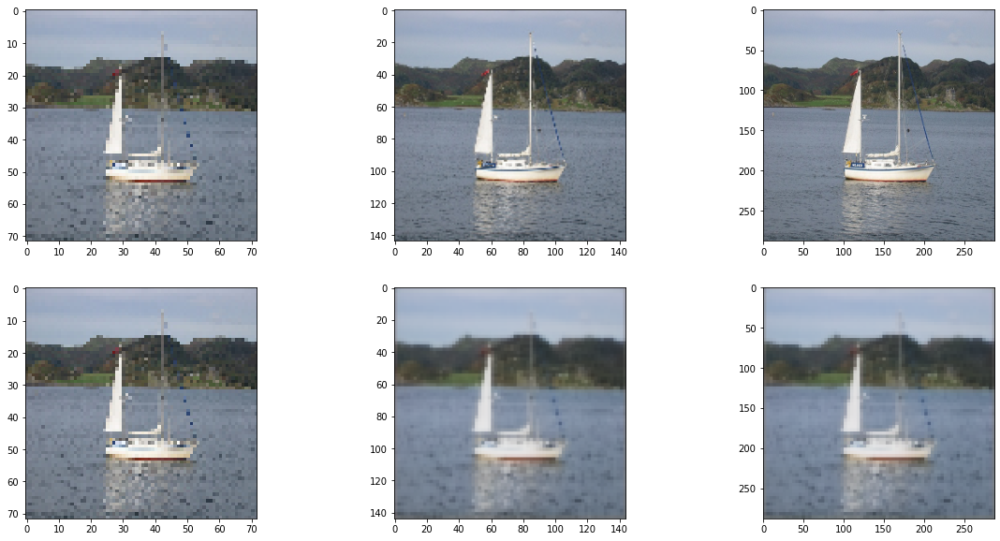

In [ ]:
us_train = model.predict(train_data)
compare_pred(train_data, us_train, 0)

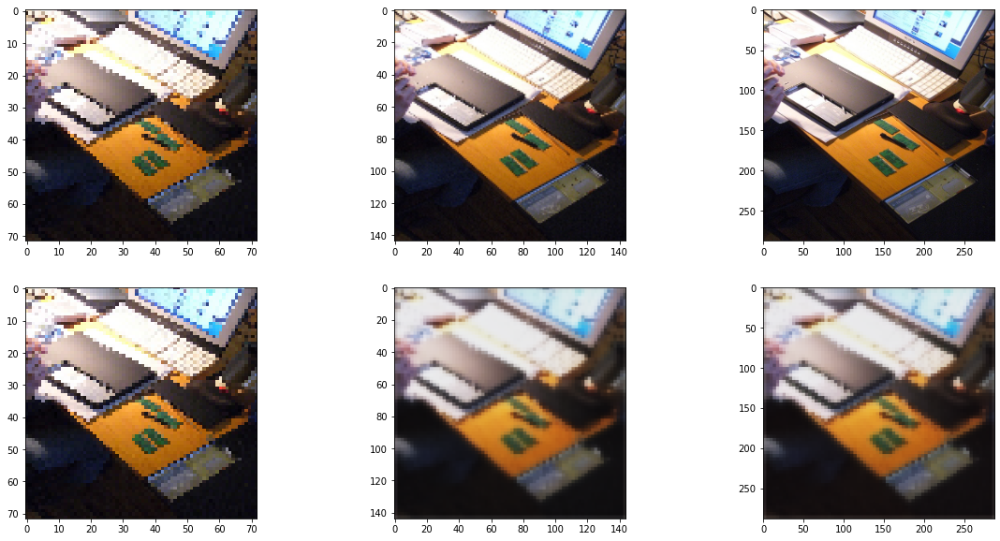

In [ ]:
us_val = model.predict(val_data)
compare_pred(val_data, us_val, 0)

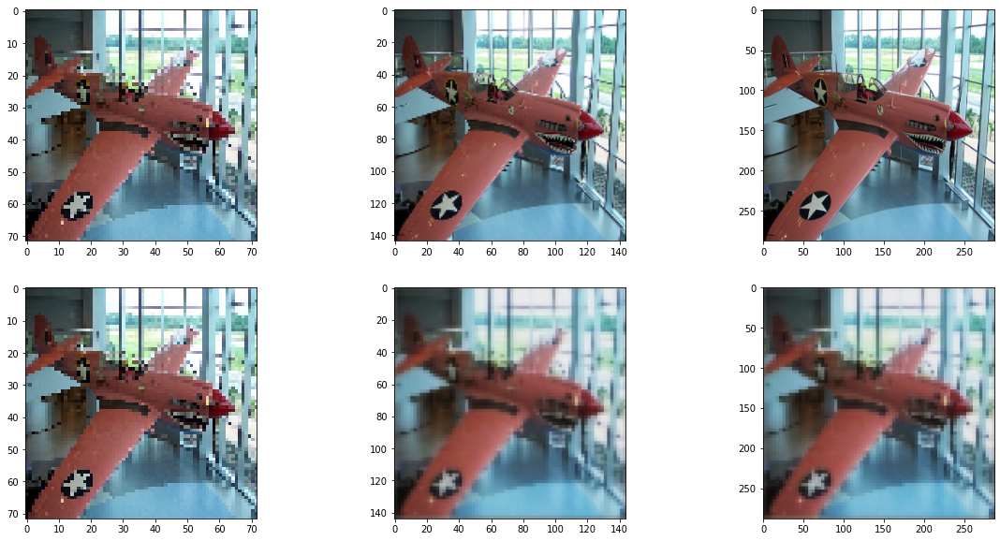

In [ ]:
us_test = model.predict(test_data)
compare_pred(test_data, us_test, 0)

# Residual

## Training

In [ ]:
train_data = SuperResolutionGenerator("train", 5, cut=100)
val_data = SuperResolutionGenerator("val", 5, cut=30)
test_data = SuperResolutionGenerator("test", 5, cut=10)

Model: "multi_scale"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 72, 72, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_3 (Conv2D)               (None, 72, 72, 64)   1792        input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_4 (Conv2D)               (None, 72, 72, 64)   36928       conv2d_3[0][0]                   
__________________________________________________________________________________________________
conv2d_5 (Conv2D)               (None, 72, 72, 64)   36928       conv2d_4[0][0]                   
________________________________________________________________________________________

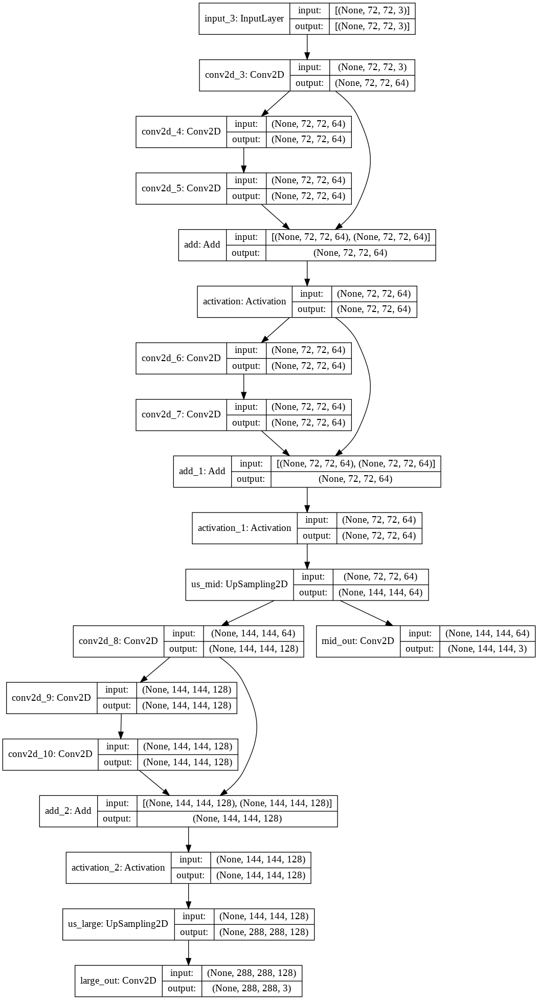

In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras import layers
from keras import Model


def psnr(y_true, y_pred):
  return tf.reduce_mean(tf.image.psnr(y_true, y_pred, max_val=1.0))

def res_block(f):
  def inner_block(x):
    y = layers.Conv2D(f, 3, activation='relu', padding='same')(x)
    y = layers.Conv2D(f, 3, activation='relu', padding='same')(y)
    out = layers.Add()([x, y])
    out = layers.Activation(keras.activations.relu)(out)
    return out
  
  return inner_block

def model_gen():
  inputs = layers.Input(shape=(72, 72, 3))
  x = layers.Conv2D(64, 3, activation='relu', padding='same')(inputs)
  x = res_block(64)(x)
  x = res_block(64)(x)
  x = layers.UpSampling2D(name='us_mid')(x)
  o_mid = layers.Conv2D(3, 1, activation='sigmoid', name="mid_out")(x)
  x_large = layers.Conv2D(128, 3, activation='relu', padding='same')(x)
  x_large = res_block(128)(x_large)
  x_large = layers.UpSampling2D(name='us_large')(x_large)
  o_large = layers.Conv2D(3, 1, activation='sigmoid', name="large_out")(x_large)
  model = Model(inputs=inputs, outputs=[o_mid, o_large], name="multi_scale")
  model.compile(optimizer='adam', loss='mse', metrics=[psnr])
  return model

model = model_gen()
print(model.summary())
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(train_data, validation_data=val_data, epochs=20)

Epoch 1/20
20/20 [==============================] - 3s 101ms/step - loss: 0.1329 - mid_out_loss: 0.0693 - large_out_loss: 0.0636 - mid_out_psnr: 11.9426 - large_out_psnr: 12.4702 - val_loss: 0.0670 - val_mid_out_loss: 0.0351 - val_large_out_loss: 0.0320 - val_mid_out_psnr: 15.4081 - val_large_out_psnr: 16.1247
Epoch 2/20
20/20 [==============================] - 2s 83ms/step - loss: 0.0369 - mid_out_loss: 0.0199 - large_out_loss: 0.0170 - mid_out_psnr: 17.4633 - large_out_psnr: 18.0226 - val_loss: 0.0270 - val_mid_out_loss: 0.0136 - val_large_out_loss: 0.0134 - val_mid_out_psnr: 19.4763 - val_large_out_psnr: 19.3311
Epoch 3/20
20/20 [==============================] - 2s 85ms/step - loss: 0.0230 - mid_out_loss: 0.0118 - large_out_loss: 0.0112 - mid_out_psnr: 19.7323 - large_out_psnr: 19.8668 - val_loss: 0.0234 - val_mid_out_loss: 0.0117 - val_large_out_loss: 0.0117 - val_mid_out_psnr: 20.0704 - val_large_out_psnr: 19.9180
Epoch 4/20
20/20 [==============================] - 2s 84ms/step -

## Results

In this model we can see a better improvment between the mid res image and the high res image, this is likly due to the added convolution block after scaling teh mid res image. The improvment is perhaps most prevlent in the test example where we can see how the star on the wing of the plane becomes much sharper between the mid res and high res predictions. In the other examples we can notice the improved details as well, but it does still seem like the model smiply blurs the image.

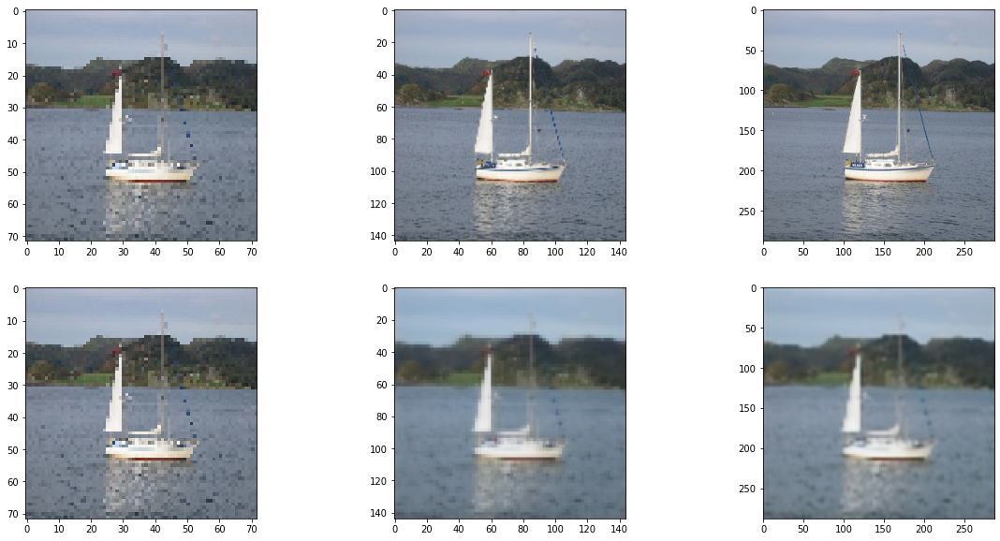

In [ ]:
us_train = model.predict(train_data)
compare_pred(train_data, us_train, 0)

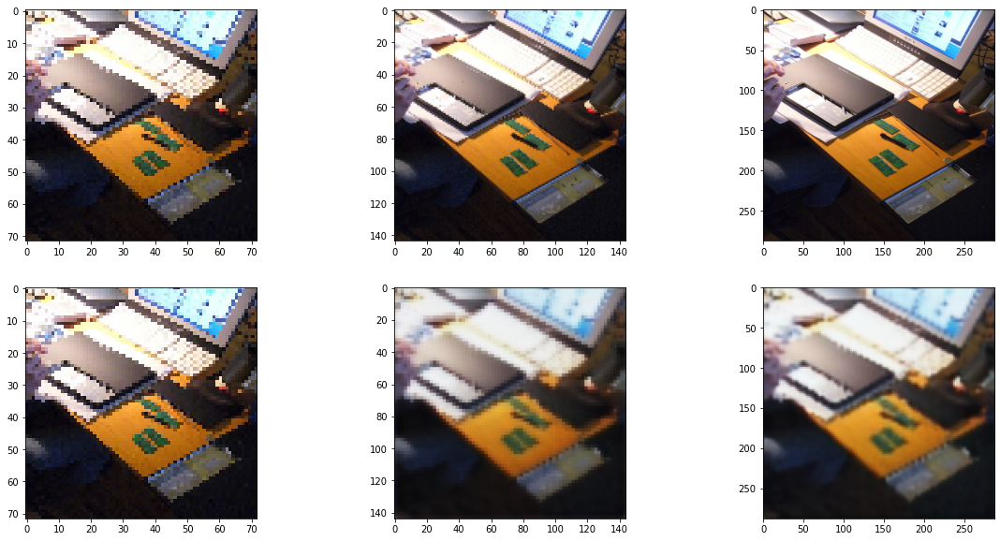

In [ ]:
us_val = model.predict(val_data)
compare_pred(val_data, us_val, 0)

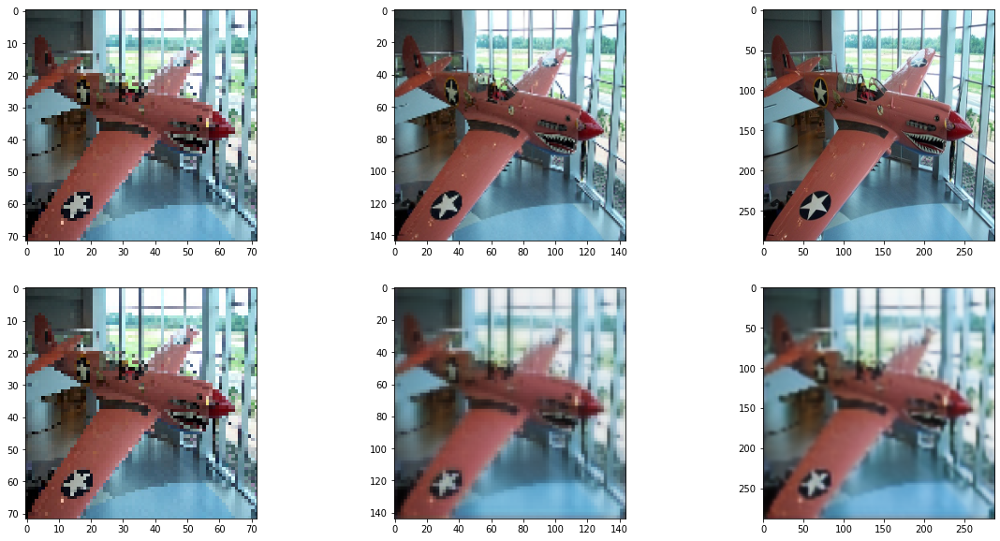

In [ ]:
us_test = model.predict(test_data)
compare_pred(test_data, us_test, 0)

# Dilation

## Training

In [ ]:
train_data = SuperResolutionGenerator("train", 5, cut=100)
val_data = SuperResolutionGenerator("val", 5, cut=30)
test_data = SuperResolutionGenerator("test", 5, cut=10)

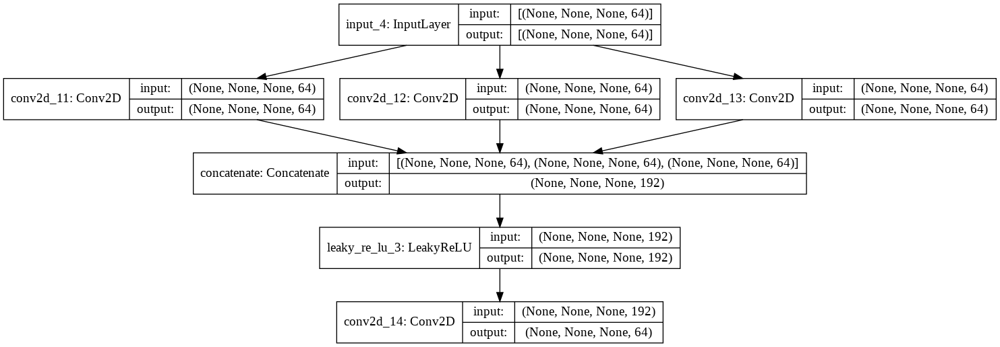

In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras import layers
from keras import Model

def psnr(y_true, y_pred):
  return tf.reduce_mean(tf.image.psnr(y_true, y_pred, max_val=1.0))

def dilated_res(f, name):
  inp = layers.Input((None, None, f))
  d1 = layers.Conv2D(f, 3, activation=layers.LeakyReLU(0.2), padding='same')(inp)
  d2 = layers.Conv2D(f, 3, dilation_rate=2, activation=layers.LeakyReLU(0.2), padding='same')(inp)
  d3 = layers.Conv2D(f, 3, dilation_rate=4, activation=layers.LeakyReLU(0.2), padding='same')(inp)
  cat = layers.Concatenate()([d1, d2, d3])
  cat = layers.LeakyReLU()(cat)
  out = layers.Conv2D(f, 1, activation='relu', padding='same')(cat)
  model = Model(inputs=inp, outputs=out, name=name)
  return model

keras.utils.plot_model(dilated_res(64, name="dial_block"), show_shapes=True)

Model: "multi_scale"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 72, 72, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_15 (Conv2D)              (None, 72, 72, 32)   896         input_5[0][0]                    
__________________________________________________________________________________________________
dial_block_base_1 (Functional)  (None, None, None, 3 30848       conv2d_15[0][0]                  
__________________________________________________________________________________________________
dial_block_base_2 (Functional)  (None, None, None, 3 30848       dial_block_base_1[0][0]          
________________________________________________________________________________________

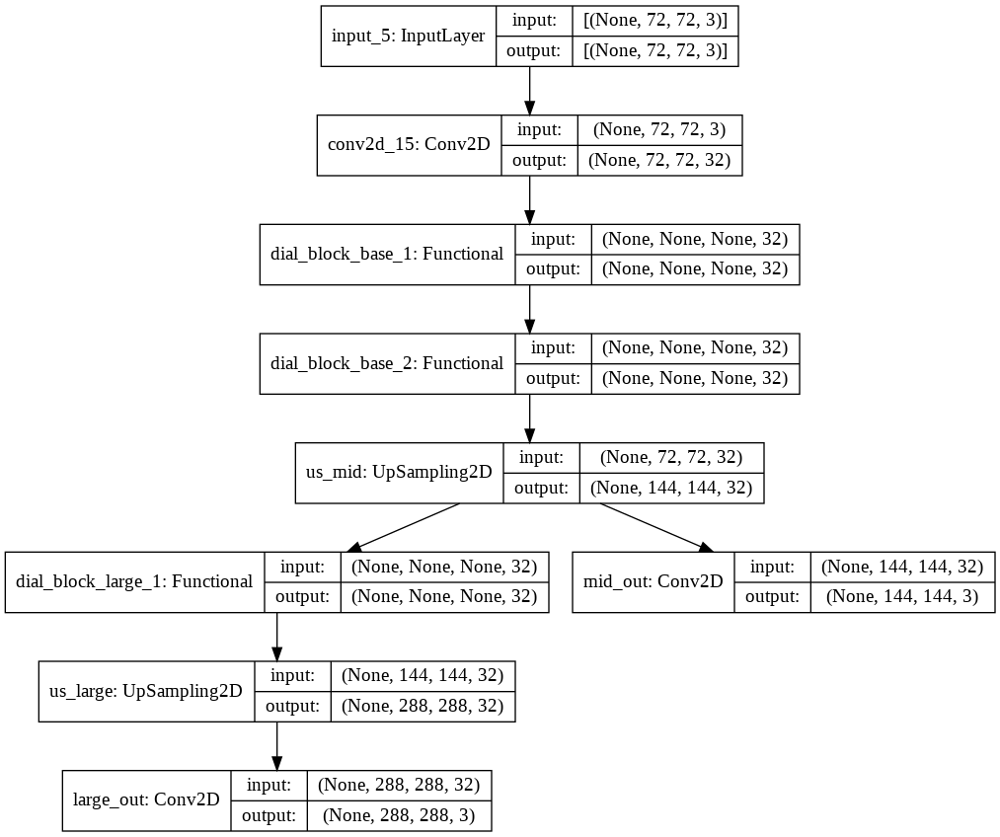

In [ ]:
def model_gen():
  inputs = layers.Input(shape=(72, 72, 3))
  x = layers.Conv2D(32, 3, activation='relu', padding='same')(inputs)
  x = dilated_res(32, name="dial_block_base_1")(x)
  x = dilated_res(32, name="dial_block_base_2")(x)
  x = layers.UpSampling2D(name='us_mid')(x)
  o_mid = layers.Conv2D(3, 1, activation='sigmoid', name="mid_out")(x)
  x_large = dilated_res(32, name="dial_block_large_1")(x)
  x_large = layers.UpSampling2D(name='us_large')(x_large)
  o_large = layers.Conv2D(3, 1, activation='sigmoid', name="large_out")(x_large)
  model = Model(inputs=inputs, outputs=[o_mid, o_large], name="multi_scale")
  model.compile(optimizer='adam', loss='mse', metrics=[psnr])
  return model

model = model_gen()
print(model.summary())
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(train_data, validation_data=val_data, epochs=20)

Epoch 1/20
20/20 [==============================] - 3s 90ms/step - loss: 0.1499 - mid_out_loss: 0.0758 - large_out_loss: 0.0741 - mid_out_psnr: 11.5185 - large_out_psnr: 11.6518 - val_loss: 0.0744 - val_mid_out_loss: 0.0397 - val_large_out_loss: 0.0346 - val_mid_out_psnr: 14.5169 - val_large_out_psnr: 15.1671
Epoch 2/20
20/20 [==============================] - 1s 72ms/step - loss: 0.0594 - mid_out_loss: 0.0325 - large_out_loss: 0.0269 - mid_out_psnr: 15.3083 - large_out_psnr: 16.2231 - val_loss: 0.0353 - val_mid_out_loss: 0.0175 - val_large_out_loss: 0.0178 - val_mid_out_psnr: 18.0597 - val_large_out_psnr: 18.1215
Epoch 3/20
20/20 [==============================] - 1s 73ms/step - loss: 0.0309 - mid_out_loss: 0.0155 - large_out_loss: 0.0154 - mid_out_psnr: 18.4371 - large_out_psnr: 18.4818 - val_loss: 0.0327 - val_mid_out_loss: 0.0150 - val_large_out_loss: 0.0177 - val_mid_out_psnr: 18.6671 - val_large_out_psnr: 17.8591
Epoch 4/20
20/20 [==============================] - 1s 72ms/step - 

## Results

In general the use of dilated convolutions does not seem to change the results significantly the images look almost identical to the ones from the plain ResNet model, though we can see some more artifacts, especially in the mid res image of the train example where we can see some pinkish color covering some of the image.

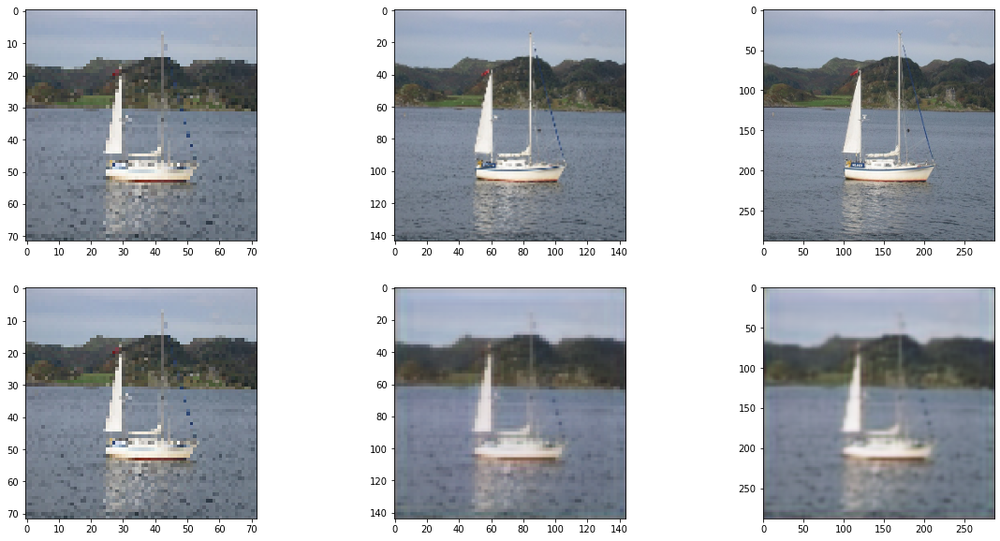

In [ ]:
us_train = model.predict(train_data)
compare_pred(train_data, us_train, 0)

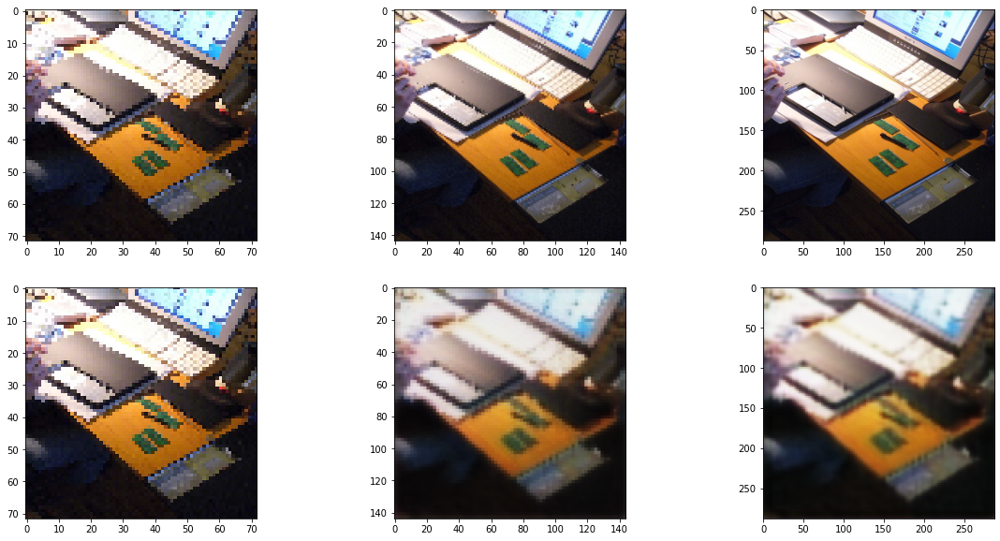

In [ ]:
us_val = model.predict(val_data)
compare_pred(val_data, us_val, 0)

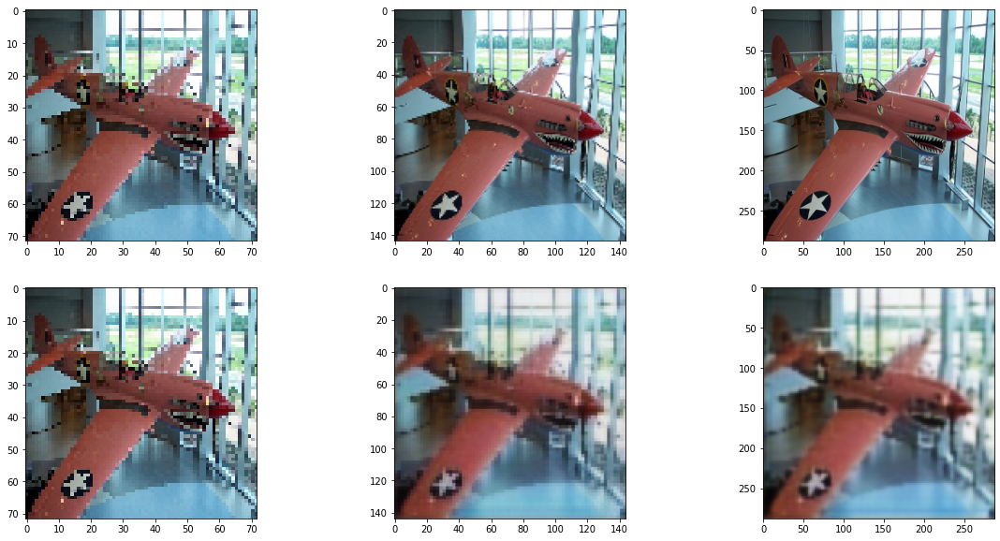

In [ ]:
us_test = model.predict(test_data)
compare_pred(test_data, us_test, 0)

# Transfer Learning

## Training

In [ ]:
train_data = SuperResolutionGenerator("train", 5, cut=100)
val_data = SuperResolutionGenerator("val", 5, cut=30)
test_data = SuperResolutionGenerator("test", 5, cut=10)

58892288/58889256 [==============================] - 1s 0us/step


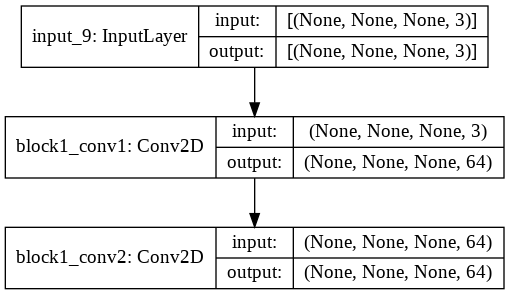

In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras import layers
from keras import Model
from tensorflow.keras.applications import VGG16

def psnr(y_true, y_pred):
  return tf.reduce_mean(tf.image.psnr(y_true, y_pred, max_val=1.0))

def vgg_fe():
  vgg = VGG16(include_top=False)
  fe = Model(vgg.input, vgg.layers[2].output, name="VGG_FE")
  fe.trainable = False
  return fe

keras.utils.plot_model(vgg_fe(), show_shapes=True)

Model: "multi_scale"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_10 (InputLayer)           [(None, 72, 72, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_28 (Conv2D)              (None, 72, 72, 64)   1792        input_10[0][0]                   
__________________________________________________________________________________________________
conv2d_29 (Conv2D)              (None, 72, 72, 64)   36928       conv2d_28[0][0]                  
__________________________________________________________________________________________________
VGG_FE (Functional)             (None, None, None, 6 38720       input_10[0][0]                   
________________________________________________________________________________________

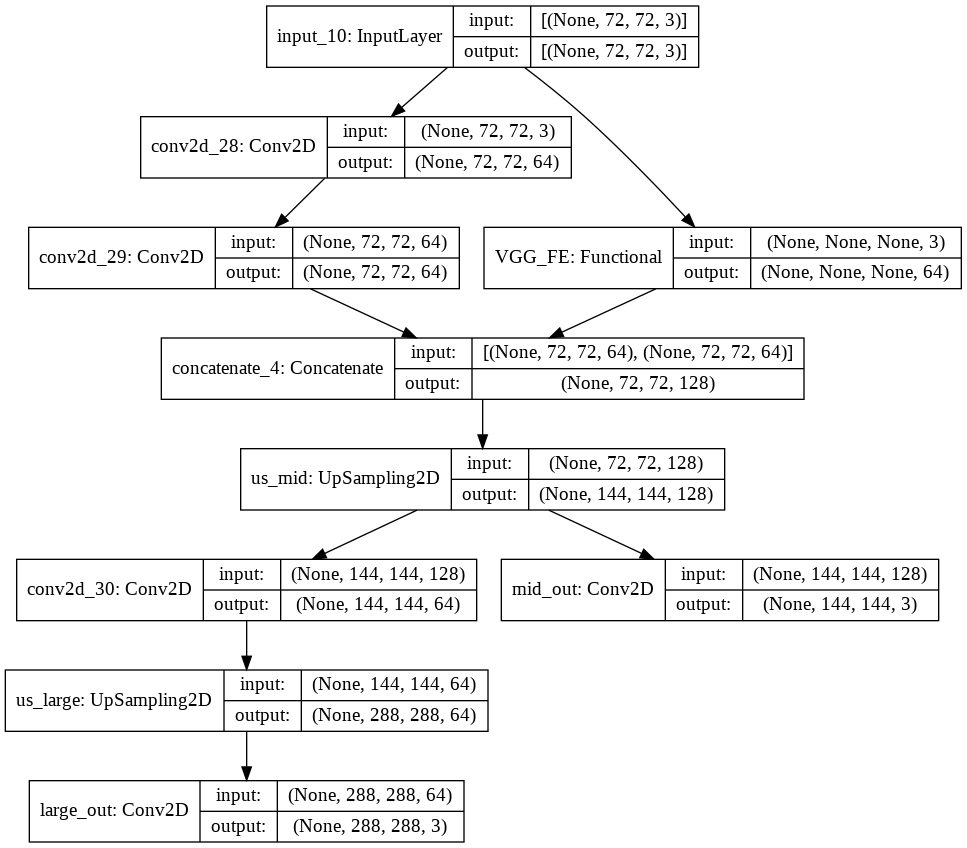

In [ ]:
def model_gen():
  inputs = layers.Input(shape=(72, 72, 3))
  x = layers.Conv2D(64, 3, activation='relu', padding='same')(inputs)
  x = layers.Conv2D(64, 3, activation='relu', padding='same')(x)
  x_vgg = vgg_fe()(inputs)
  x = layers.concatenate([x, x_vgg])
  x = layers.UpSampling2D(name='us_mid')(x)
  o_mid = layers.Conv2D(3, 1, activation='sigmoid', name="mid_out")(x)
  x_large = layers.Conv2D(64, 3, activation='relu', padding='same')(x)
  x_large = layers.UpSampling2D(name='us_large')(x_large)
  o_large = layers.Conv2D(3, 1, activation='sigmoid', name="large_out")(x_large)
  model = Model(inputs=inputs, outputs=[o_mid, o_large], name="multi_scale")
  model.compile(optimizer='adam', loss='mse', metrics=[psnr])
  return model

model = model_gen()
print(model.summary())
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(train_data, validation_data=val_data, epochs=20)

Epoch 1/20
20/20 [==============================] - 2s 77ms/step - loss: 0.3099 - mid_out_loss: 0.1949 - large_out_loss: 0.1150 - mid_out_psnr: 7.7313 - large_out_psnr: 10.3131 - val_loss: 0.1647 - val_mid_out_loss: 0.1408 - val_large_out_loss: 0.0240 - val_mid_out_psnr: 8.8944 - val_large_out_psnr: 16.5463
Epoch 2/20
20/20 [==============================] - 1s 74ms/step - loss: 0.1371 - mid_out_loss: 0.1179 - large_out_loss: 0.0193 - mid_out_psnr: 9.6814 - large_out_psnr: 17.5565 - val_loss: 0.0852 - val_mid_out_loss: 0.0710 - val_large_out_loss: 0.0142 - val_mid_out_psnr: 12.0427 - val_large_out_psnr: 19.0516
Epoch 3/20
20/20 [==============================] - 1s 67ms/step - loss: 0.0705 - mid_out_loss: 0.0585 - large_out_loss: 0.0120 - mid_out_psnr: 12.7576 - large_out_psnr: 19.5137 - val_loss: 0.0570 - val_mid_out_loss: 0.0461 - val_large_out_loss: 0.0108 - val_mid_out_psnr: 14.2660 - val_large_out_psnr: 20.4081
Epoch 4/20
20/20 [==============================] - 1s 66ms/step - los

## Results

Using the pretrained VGG16 layers seems to not work well for this task, at the very least not in this configuration. We can see much more artifacts then in the dilated convolution model when looking at the mid res predictions, the high res predictions have less artifacts tough they are of much lesser quality compared to the other models and still do retain some color differences from the original images.

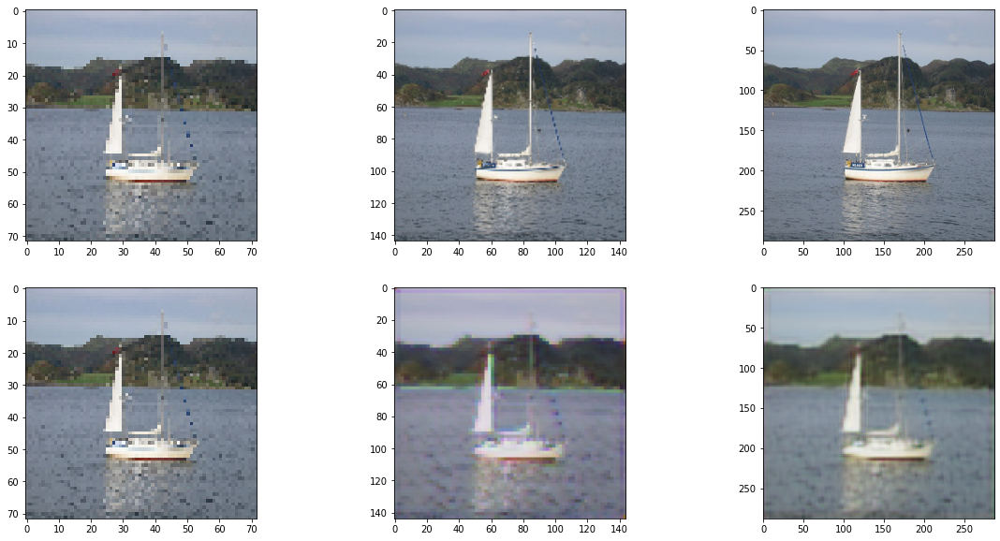

In [ ]:
us_train = model.predict(train_data)
compare_pred(train_data, us_train, 0)

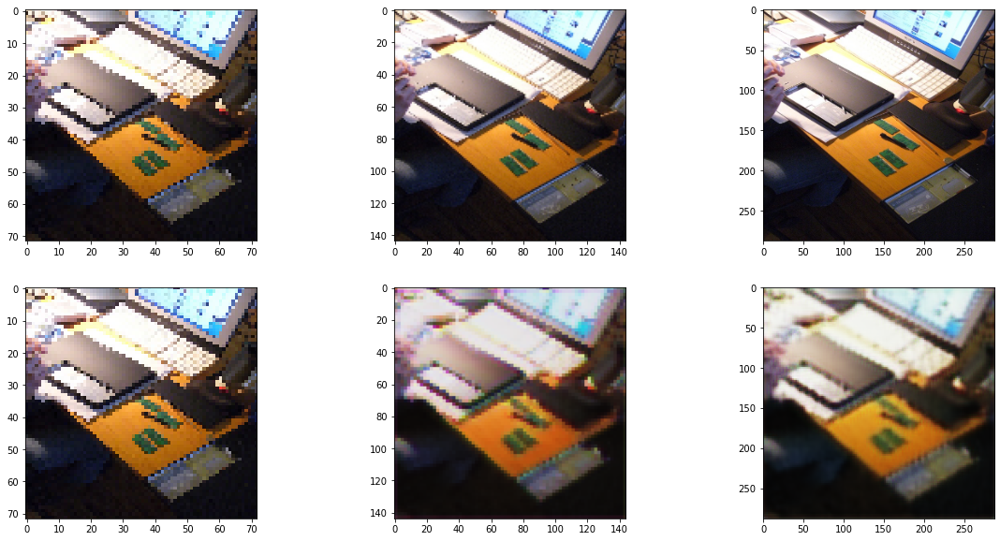

In [ ]:
us_val = model.predict(val_data)
compare_pred(val_data, us_val, 0)

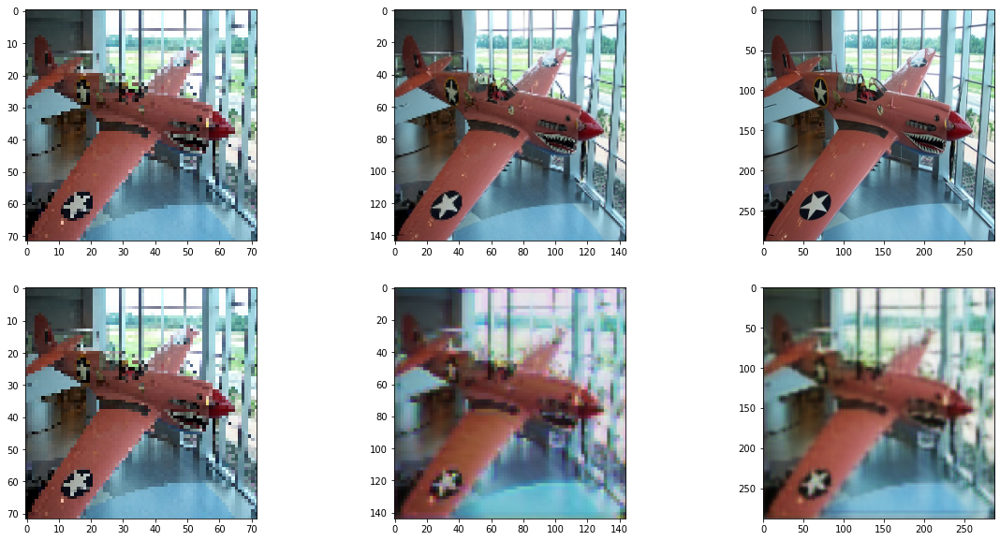

In [ ]:
us_test = model.predict(test_data)
compare_pred(test_data, us_test, 0)

# Depth to Space

## Training

In [ ]:
train_data = SuperResolutionGenerator("train", 5, cut=100)
val_data = SuperResolutionGenerator("val", 5, cut=30)
test_data = SuperResolutionGenerator("test", 5, cut=10)

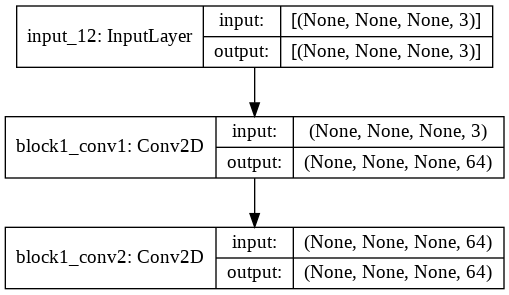

In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras import layers
from keras import Model
from tensorflow.keras.applications import VGG16

def psnr(y_true, y_pred):
  return tf.reduce_mean(tf.image.psnr(y_true, y_pred, max_val=1.0))

def vgg_fe():
  vgg = VGG16(include_top=False)
  fe = Model(vgg.input, vgg.layers[2].output, name="VGG_FE")
  fe.trainable = False
  return fe

keras.utils.plot_model(vgg_fe(), show_shapes=True)

Model: "multi_scale"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_13 (InputLayer)           [(None, 72, 72, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_31 (Conv2D)              (None, 72, 72, 64)   1792        input_13[0][0]                   
__________________________________________________________________________________________________
conv2d_32 (Conv2D)              (None, 72, 72, 64)   36928       conv2d_31[0][0]                  
__________________________________________________________________________________________________
VGG_FE (Functional)             (None, None, None, 6 38720       input_13[0][0]                   
________________________________________________________________________________________

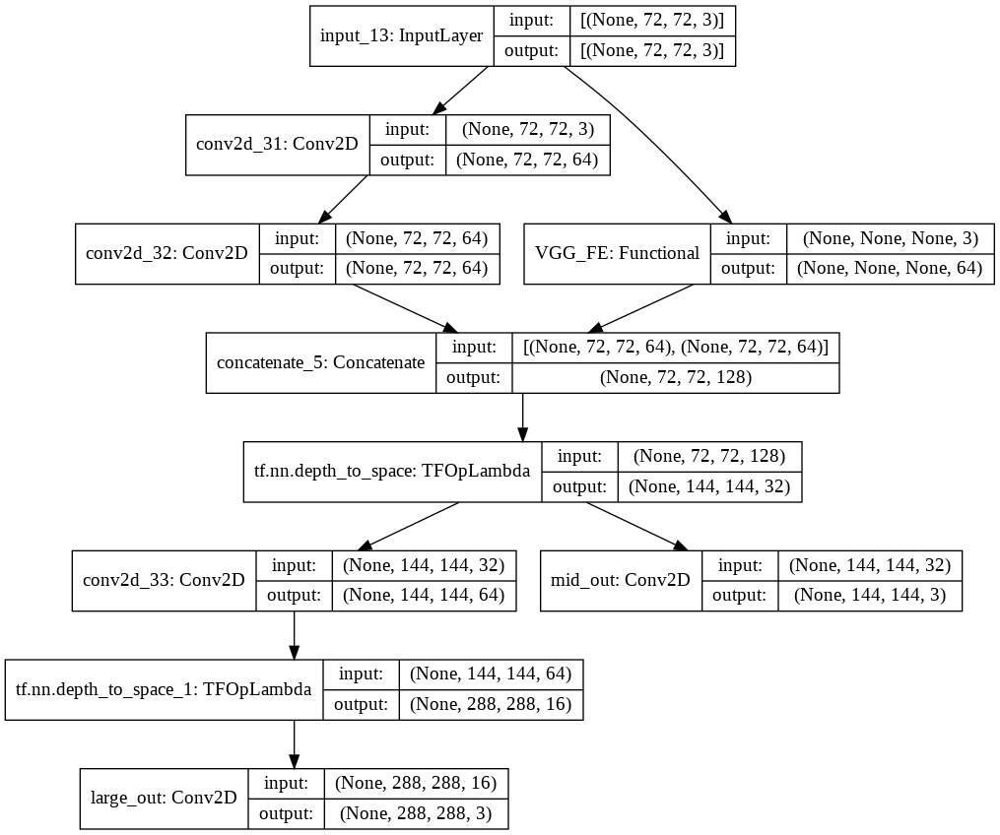

In [ ]:
def model_gen():
  inputs = layers.Input(shape=(72, 72, 3))
  x = layers.Conv2D(64, 3, activation='relu', padding='same')(inputs)
  x = layers.Conv2D(64, 3, activation='relu', padding='same')(x)
  x_vgg = vgg_fe()(inputs)
  x = layers.concatenate([x, x_vgg])
  x = tf.nn.depth_to_space(x, block_size=2)
  o_mid = layers.Conv2D(3, 1, activation='sigmoid', name="mid_out")(x)
  x_large = layers.Conv2D(64, 3, activation='relu', padding='same')(x)
  x_large = tf.nn.depth_to_space(x_large, block_size=2)
  o_large = layers.Conv2D(3, 1, activation='sigmoid', name="large_out")(x_large)
  model = Model(inputs=inputs, outputs=[o_mid, o_large], name="multi_scale")
  model.compile(optimizer='adam', loss='mse', metrics=[psnr])
  return model

model = model_gen()
print(model.summary())
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(train_data, validation_data=val_data, epochs=20)

Epoch 1/20
20/20 [==============================] - 3s 83ms/step - loss: 0.2688 - mid_out_loss: 0.1711 - large_out_loss: 0.0977 - mid_out_psnr: 7.7537 - large_out_psnr: 10.4043 - val_loss: 0.2110 - val_mid_out_loss: 0.1539 - val_large_out_loss: 0.0572 - val_mid_out_psnr: 8.2129 - val_large_out_psnr: 12.7245
Epoch 2/20
20/20 [==============================] - 1s 63ms/step - loss: 0.1882 - mid_out_loss: 0.1421 - large_out_loss: 0.0462 - mid_out_psnr: 8.5354 - large_out_psnr: 13.5496 - val_loss: 0.1618 - val_mid_out_loss: 0.1276 - val_large_out_loss: 0.0342 - val_mid_out_psnr: 9.0172 - val_large_out_psnr: 14.9991
Epoch 3/20
20/20 [==============================] - 1s 64ms/step - loss: 0.1408 - mid_out_loss: 0.1149 - large_out_loss: 0.0259 - mid_out_psnr: 9.4958 - large_out_psnr: 16.0628 - val_loss: 0.1295 - val_mid_out_loss: 0.1080 - val_large_out_loss: 0.0215 - val_mid_out_psnr: 9.7487 - val_large_out_psnr: 17.0725
Epoch 4/20
20/20 [==============================] - 1s 65ms/step - loss: 

## Results

We can see that using the Depth to Space scaling layer does not improve the resutls, in fact the mid res predicted images have even more artifacts then before. it seems that the have some pattern of little dots with noisy colors on them. While the high res images still look unimpresive, and worse than even the basic multi output model. We can see in the metrics as well that the psnr of the mid res image is much lower compared to other models, which numericly explains the artifactiing.

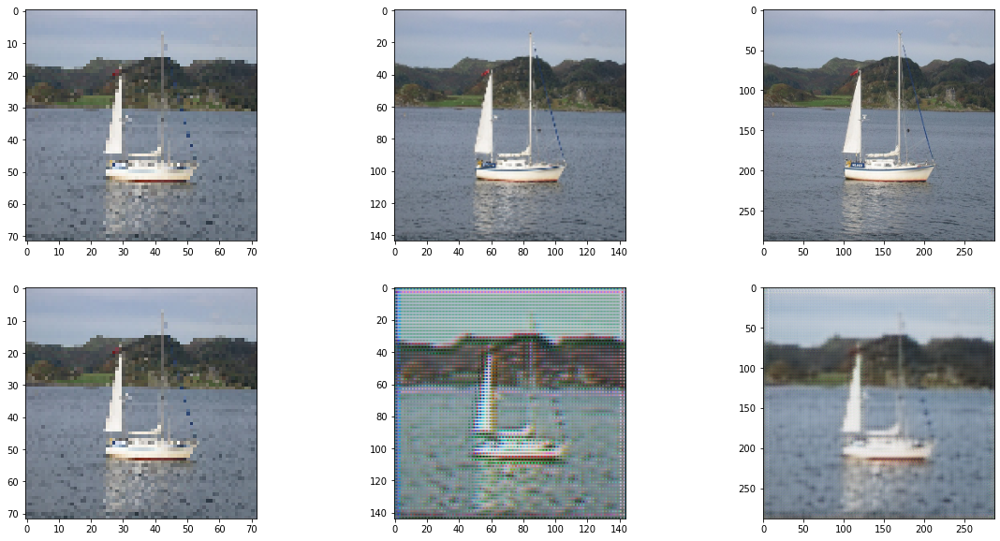

In [ ]:
us_train = model.predict(train_data)
compare_pred(train_data, us_train, 0)

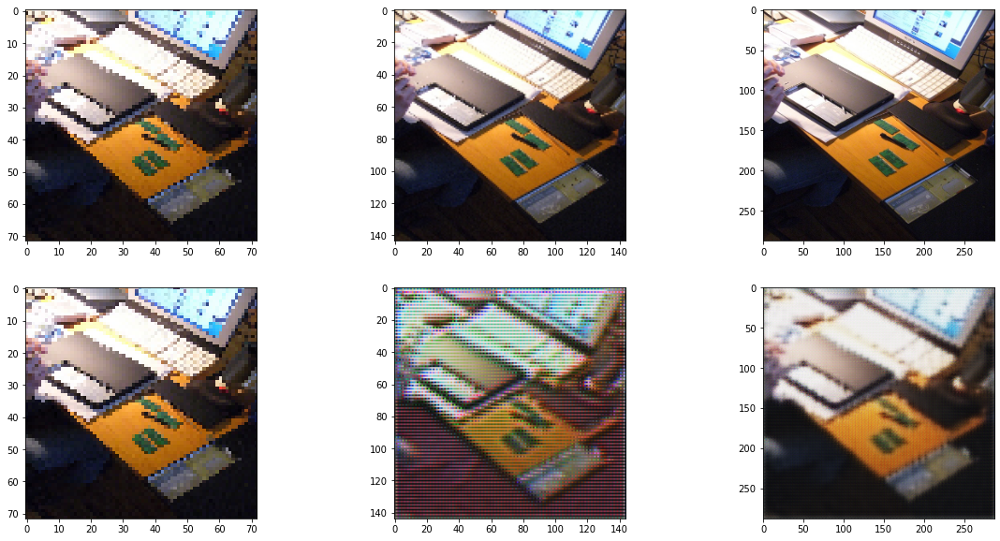

In [ ]:
us_val = model.predict(val_data)
compare_pred(val_data, us_val, 0)

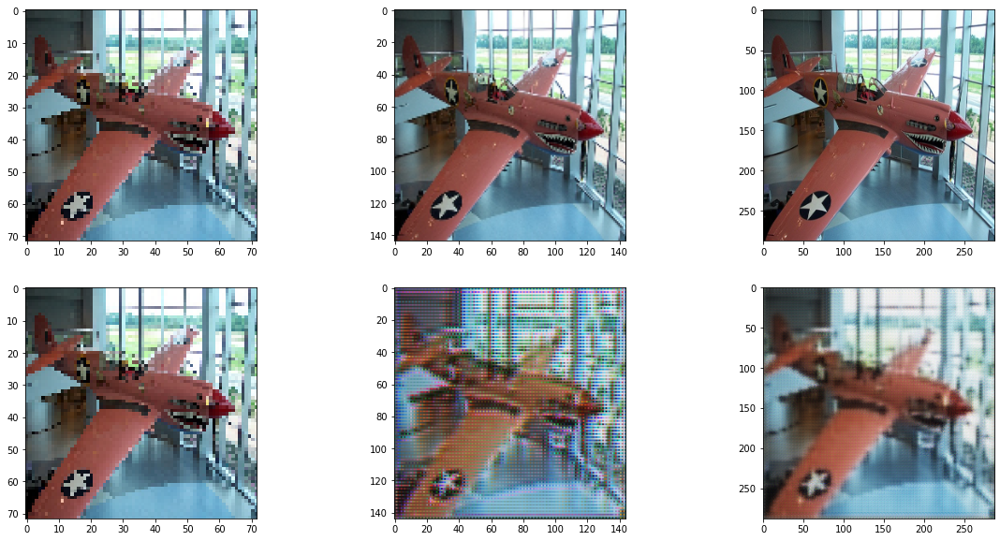

In [ ]:
us_test = model.predict(test_data)
compare_pred(test_data, us_test, 0)

# Best Model

## Training

In [ ]:
train_data = SuperResolutionGenerator("train", 100)
val_data = SuperResolutionGenerator("val", 100)
test_data = SuperResolutionGenerator("test", 100)

Model: "multi_scale"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 72, 72, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_17 (Conv2D)              (None, 72, 72, 32)   128         input_4[0][0]                    
__________________________________________________________________________________________________
conv2d_18 (Conv2D)              (None, 72, 72, 32)   9248        conv2d_17[0][0]                  
__________________________________________________________________________________________________
conv2d_19 (Conv2D)              (None, 72, 72, 32)   9248        conv2d_18[0][0]                  
________________________________________________________________________________________

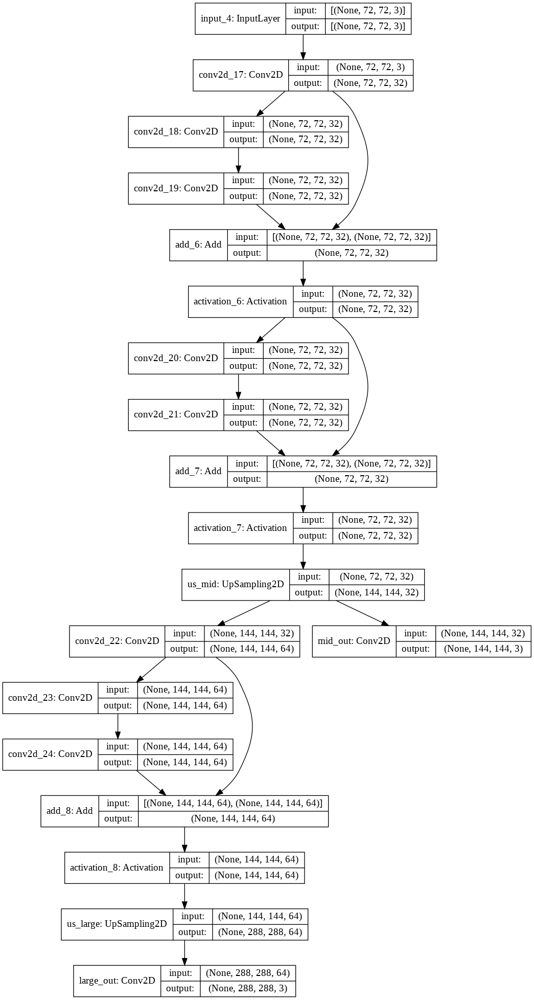

In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras import layers
from keras import Model


def psnr(y_true, y_pred):
  return tf.reduce_mean(tf.image.psnr(y_true, y_pred, max_val=1.0))

def res_block(f):
  def inner_block(x):
    y = layers.Conv2D(f, 3, activation='relu', padding='same')(x)
    y = layers.Conv2D(f, 3, activation='relu', padding='same')(y)
    out = layers.Add()([x, y])
    out = layers.Activation(keras.activations.relu)(out)
    return out
  
  return inner_block

def model_gen():
  inputs = layers.Input(shape=(72, 72, 3))
  x = layers.Conv2D(32, 1, activation='relu', padding='same')(inputs)
  x = res_block(32)(x)
  x = res_block(32)(x)
  x = layers.UpSampling2D(name='us_mid')(x)
  o_mid = layers.Conv2D(3, 1, activation='sigmoid', name="mid_out")(x)
  x_large = layers.Conv2D(64, 1, activation='relu', padding='same')(x)
  x_large = res_block(64)(x_large)
  x_large = layers.UpSampling2D(name='us_large')(x_large)
  o_large = layers.Conv2D(3, 1, activation='sigmoid', name="large_out")(x_large)
  model = Model(inputs=inputs, outputs=[o_mid, o_large], name="multi_scale")
  model.compile(optimizer='adam', loss='mse', metrics=[psnr])
  return model

model = model_gen()
print(model.summary())
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
import imageio

class TrainingGif(keras.callbacks.Callback):

    def __init__(self, val_img):
      self.val_img = val_img
      self.gif = []

    def on_epoch_end(self, epoch, logs=None):
      pred = self.model.predict(np.array([self.val_img]))[1][0]
      self.gif.append((pred * 255).astype(np.uint8))

    def on_train_end(self, logs=None):
      imageio.mimsave('training.gif', self.gif)

In [ ]:
model.fit(train_data, validation_data=val_data, epochs=20, callbacks=[TrainingGif(test_data[0][0][0])])

Epoch 1/20
41/41 [==============================] - 46s 1s/step - loss: 0.1086 - mid_out_loss: 0.0608 - large_out_loss: 0.0479 - mid_out_psnr: 12.8135 - large_out_psnr: 14.4160 - val_loss: 0.0243 - val_mid_out_loss: 0.0132 - val_large_out_loss: 0.0111 - val_mid_out_psnr: 19.3006 - val_large_out_psnr: 20.0704
Epoch 2/20
41/41 [==============================] - 42s 1s/step - loss: 0.0224 - mid_out_loss: 0.0122 - large_out_loss: 0.0102 - mid_out_psnr: 19.6950 - large_out_psnr: 20.5313 - val_loss: 0.0179 - val_mid_out_loss: 0.0096 - val_large_out_loss: 0.0084 - val_mid_out_psnr: 20.8507 - val_large_out_psnr: 21.4661
Epoch 3/20
41/41 [==============================] - 42s 1s/step - loss: 0.0179 - mid_out_loss: 0.0095 - large_out_loss: 0.0084 - mid_out_psnr: 20.8767 - large_out_psnr: 21.4890 - val_loss: 0.0168 - val_mid_out_loss: 0.0089 - val_large_out_loss: 0.0079 - val_mid_out_psnr: 21.2030 - val_large_out_psnr: 21.7509
Epoch 4/20
41/41 [==============================] - 41s 1s/step - loss

## Results

We can see that training on the entire data set did not help much. The psnr metric seems a little higher then the previeus models but not by a lot, and we can still see that the model mostly blurs the images and fills in similar colors in the sorrounding of the originals. This is likly due to the simplicity of the model and the veraity of the data. Because the data is very diverse, and the model isvery simple, the models is unable to generate additional information ontop of the base image, because it does not understand the image. This means that all it can do is enlarge and try and smooth our the colors to seem less pixelated and closer to the original.

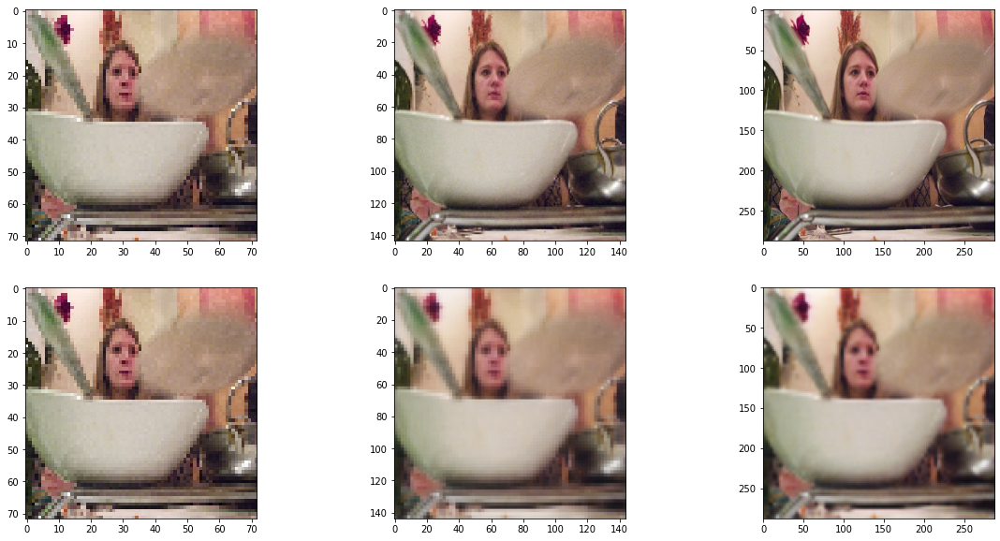

In [ ]:
us_train = model.predict(train_data[0][0])
compare_pred(train_data, us_train, 1)

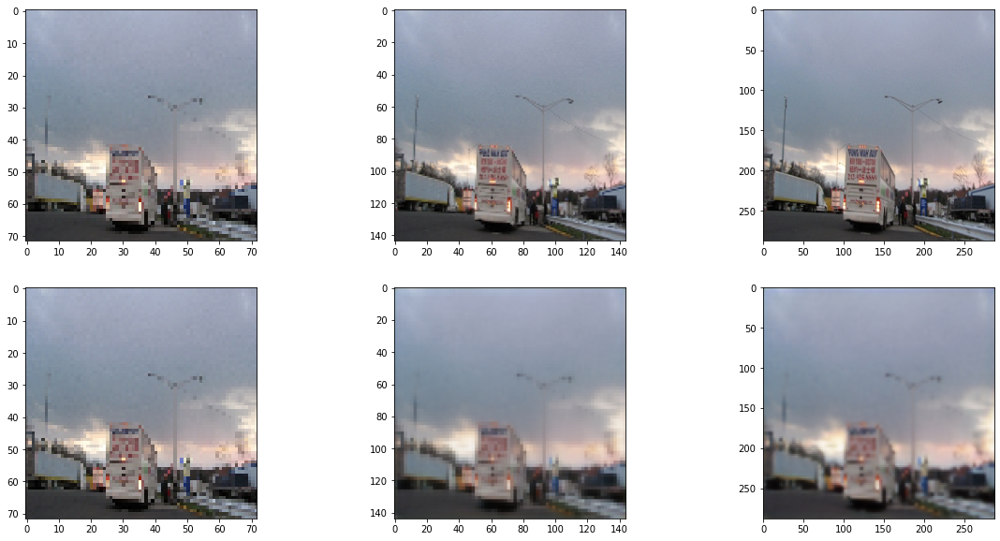

In [ ]:
us_val = model.predict(val_data[0][0])
compare_pred(val_data, us_val, 1)

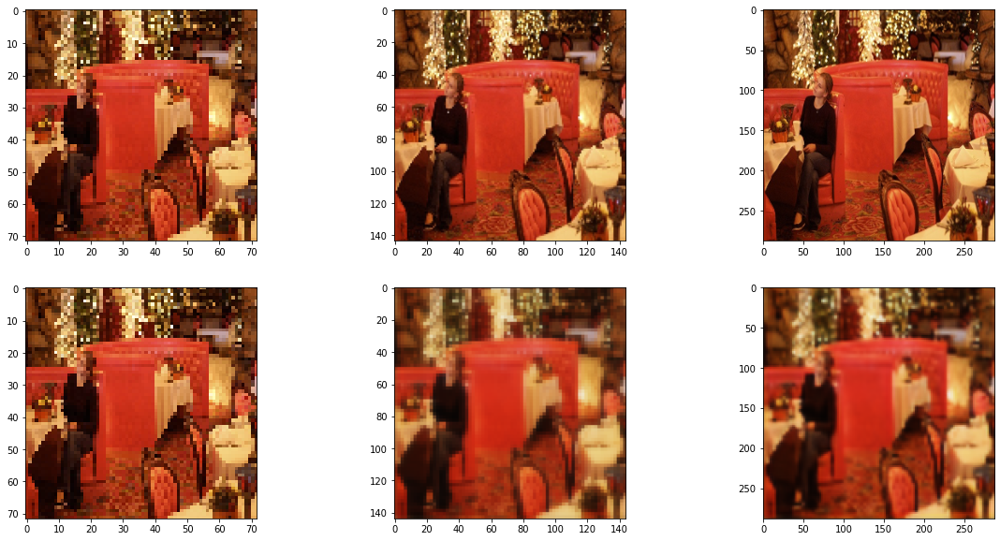

In [ ]:
us_test = model.predict(test_data[0][0])
compare_pred(test_data, us_test, 1)

## Model Training GIF

![gif](https://media.giphy.com/media/J1RsoCPvUUFfKIKuwh/giphy.gif)